This notebook is for post-processing 'lm-eval' outputs in the format of:

output folder > task > model > results_datetime.json

and

output folder > task > model > samples_task_datetime.jsonl

Assuming the following directory structure

```markdown
main_dir/
├── task1/
│ ├── model1/
│ │ └── results.json
│ ├── model2/
│ │ └── results.json
├── task2/
│ ├── model1/
│ │ └── results.json
│ ├── model2/
│ │ └── results.json
```

# Execute Parsing Results File Functions

## Parsing file name nomenclature for times

In [1]:
# Now for each row in df_all_results, compute the model and time columns from the names of the files
import json
from datetime import datetime

# Helper function to extract model and timestamp from filename
def parse_filename(filename):
    base_name = os.path.basename(filename)
    parts = base_name.split('_')
    model = parts[1]
    timestamp_str = parts[-1].replace('.json', '').replace('.jsonl', '')
    timestamp = datetime.strptime(timestamp_str, '%Y-%m-%dT%H-%M-%S.%f')
    return model, timestamp

## Parse Results Files


In [2]:
import pandas as pd
import json

def extract_results_files_info(df_all_results):
    # Initialize list to store temporary DataFrames
    df_list = []

    # Loop through the DataFrame and extract data from each JSON file
    for idx, row in df_all_results.iterrows():
        results_file_path = row['Results File Path']
        
        with open(results_file_path, 'r') as f:
            results = json.load(f)

        # Extract task name (key)
        task_name = list(results['results'].keys())[0]

        # Extract the task results
        task_data = results['results'][task_name]

        # Initialize a dictionary to hold the data for the DataFrame row
        data_dict = {'Results File Path': results_file_path, 'Task': task_name}

        # Loop through the keys in task_data and add them to data_dict
        for key, value in task_data.items():
            data_dict[key] = value

        # Extract additional requested information
        config = results.get('config', {})
        gen_kwargs = config.get('gen_kwargs')
        
        # Handle the case where gen_kwargs is None
        if gen_kwargs is None:
            data_dict['temperature'] = None
        else:
            data_dict['temperature'] = gen_kwargs.get('temperature')
        
        data_dict['model_dtype'] = config.get('model_dtype')
        data_dict['total_evaluation_time_seconds'] = results.get('total_evaluation_time_seconds')
        
        configs = results.get('configs', {})
        task_config = configs.get(task_name, {})
        data_dict['output_type'] = task_config.get('output_type')

        # Extract the task size from "n-samples" section
        n_samples = results.get('n-samples', {})
        task_samples = n_samples.get(task_name, {})
        data_dict['task_size_original'] = task_samples.get('original', None)

        # Create a DataFrame for the current row
        df_results = pd.DataFrame([data_dict])

        df_list.append(df_results)

    # Concatenate all temporary DataFrames
    df_extracted_data = pd.concat(df_list, ignore_index=True)

    # Combine the DataFrames and bring over everything except the 'Results File Path' column and the 'alias' column
    df_all_results = pd.concat([df_all_results, df_extracted_data.drop(columns=['Results File Path', 'alias'], errors='ignore')], axis=1)

    return df_all_results

# Example usage
# df_all_results_files_info = extract_results_files_info(df_all_filepaths)
# print(df_all_results_files_info)


We also need to pull out the model_name info ...

doing this from the directory its in b/c the configuration output is "hf" and "model_args" which would require a lot more parsing and special cases...

In [3]:
# Function to extract model name from the file path
def extract_model(file_path):
    # Split the file path into parts
    parts = file_path.split(os.sep)
    
    # The model name is two directory levels above the file
    model_name = parts[-2]
    
    return model_name

# Apply the function to each file path
# df_all_results_files_info['Model'] = df_all_results_files_info['Results File Path'].apply(extract_model)

# Display the DataFrame
# print(df_all_results_files_info)

In [4]:
# df_all_results_files_info

## Filtering down to the desired results to analyze

In [5]:
def filter_unique_models(df_all_results_files_info, tasks_to_keep=['sysengbench', 'yes_or_no_tasks']):
    # Step 1: Filter the DataFrame for the specified tasks
    df_filtered = df_all_results_files_info[df_all_results_files_info['Task'].isin(tasks_to_keep)]

    # Step 2: Convert the Timestamp column to datetime
    df_filtered['Timestamp'] = pd.to_datetime(df_filtered['Timestamp'])

    # Step 3: Sort the DataFrame by "Timestamp" in descending order
    df_filtered = df_filtered.sort_values(by='Timestamp', ascending=False)

    # Step 4: Drop duplicates based on the "Model" column, keeping only the most recent entry for each model
    df_unique_models = df_filtered.drop_duplicates(subset='Model', keep='first')

    # Step 5: Extract the relevant columns
    df_all_samples = df_unique_models

    return df_all_samples

# Execute Parsing Results Files

In [6]:
############# OVERALL EXECUTION WORKFLOW ###################
import glob
import os
import numpy as np
import pandas as pd

# base_dir_path = 'output5-20241113-SysEngBench1.0'
# base_dir_path = 'output6-20241118-ft-gpt4o-vs-gpt40 (new prompt)'
# base_dir_path = 'output7-20241119-SysEngBench1.0-newprompt Wiley INCOSE'
base_dir_path = 'output7-20241119-SysEngBench1.0-prompt1.1 Wiley INCOSE (Journal 1)'

# Finding all results_*.json and results_*.jsonl files in the directory and its subdirectories
results_files_json = glob.glob(os.path.join(base_dir_path, '**/results_*.json'), recursive=True)
samples_files_jsonl = glob.glob(os.path.join(base_dir_path, '**/samples_*.jsonl'), recursive=True)

# Assuming the pairs are in order for json and jsonl files 
# Create a DataFrame with the two lists as columns
df_all_filepaths = pd.DataFrame({
    'Results File Path': results_files_json,
    'Samples File Path': samples_files_jsonl
})

# Extract mtimestamp and add as new columns
df_all_filepaths['Timestamp'] = df_all_filepaths['Results File Path'].apply(lambda x: parse_filename(x)[1])

df_all_results_files_info = extract_results_files_info(df_all_filepaths)

# Apply the function to each file path
df_all_results_files_info['Model'] = df_all_results_files_info['Results File Path'].apply(extract_model)

# Optional Filter task and only keep most recent runs for each model
df_all_results_files_info_filtered = filter_unique_models(df_all_results_files_info)

C:\Users\rbell\AppData\Local\Temp\ipykernel_32364\3735612286.py:56: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_extracted_data = pd.concat(df_list, ignore_index=True)


In [9]:
df_all_results_files_info_filtered

,Results File Path,Samples File Path,Timestamp,Task,"acc,none","acc_stderr,none","acc_norm,none","acc_norm_stderr,none",temperature,model_dtype,total_evaluation_time_seconds,output_type,task_size_original,"exact_match,strict-match","exact_match_stderr,strict-match",Model
3,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 20:05:52.080543,sysengbench,NaN,NaN,NaN,NaN,NaN,None,1331.9575062460008,generate_until,1144,0.910839,0.008429,claude-3-5-haiku-20241022
5,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 19:42:44.564551,sysengbench,NaN,NaN,NaN,NaN,NaN,None,1333.0887132139997,generate_until,1144,0.941434,0.006945,claude-3-opus-20240229
4,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 19:17:29.582112,sysengbench,NaN,NaN,NaN,NaN,NaN,None,1338.5044306460004,generate_until,1144,0.955420,0.006104,claude-3-5-sonnet-20241022
19,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 18:27:46.753614,sysengbench,NaN,NaN,NaN,NaN,0.0,None,461.67663314200036,generate_until,1144,0.903846,0.008720,meta-llama__Llama-3.2-90B-Vision-Instruct-Turbo
21,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 18:17:17.992217,sysengbench,NaN,NaN,NaN,NaN,0.0,None,1605.6772401320004,generate_until,1144,0.893357,0.009130,meta-llama__Meta-Llama-3.1-405B-Instruct-Turbo
30,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 17:30:25.340816,sysengbench,NaN,NaN,NaN,NaN,0.0,None,252.1386907189999,generate_until,1144,0.928322,0.007630,nvidia__Llama-3.1-Nemotron-70B-Instruct-HF
27,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 17:24:53.339400,sysengbench,NaN,NaN,NaN,NaN,0.0,None,248.90446721100034,generate_until,1144,0.853147,0.010470,mistralai__Mixtral-8x7B-Instruct-v0.1
28,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 17:20:06.636664,sysengbench,NaN,NaN,NaN,NaN,0.0,None,294.7260205719999,generate_until,1144,0.057692,0.006897,mistralai__Mixtral-8x7B-v0.1
14,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 17:11:44.845060,sysengbench,NaN,NaN,NaN,NaN,0.0,None,505.0427901769999,generate_until,1144,0.108392,0.009195,meta-llama__Llama-2-70b-hf
26,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,output7-20241119-SysEngBench1.0-prompt1.1 Wile...,2024-11-22 16:50:42.168781,sysengbench,NaN,NaN,NaN,NaN,0.0,None,1028.056200341,generate_until,1144,0.899476,0.008894,mistralai__Mixtral-8x22B-Instruct-v0.1


# Execute Parsing Samples Files Functions
## Using df_all_results_files_info_filtered as the structure for our samples
We do this because it also has all of the model info, courtesy of the results json file for each run

In [10]:
import pandas as pd
import json

def extract_samples_data(df_all_samples):
    """
    Extracts sample data from a DataFrame by reading JSON lines from files specified in the DataFrame.

    Parameters:
    df_all_samples (pd.DataFrame): DataFrame containing columns 'Samples File Path', 'Task', 'task_size_original', 'Model', 'model_dtype', and 'temperature'.

    Returns:
    pd.DataFrame: A new DataFrame with extracted sample data including task, model, question, true answer, and predicted answer.
    """
    # Initialize a list to hold the sample data
    samples_data = []

    # Loop through the DataFrame rows
    for idx, row in df_all_samples.iterrows():
        samples_file_path = row['Samples File Path']
        task_name = row['Task']
        task_size = row['task_size_original']
        model_name = row['Model']
        model_dtype = row['model_dtype']
        temperature = row['temperature']

        # Open the file specified in the 'Samples File Path' column
        with open(samples_file_path, 'r', encoding='utf-8') as f:
            for line in f:
                try:
                    sample = json.loads(line)
                    doc = sample['doc']
                    doc_id = sample['doc_id']

                    # Extract filtered_resps only
                    filtered_resps = sample.get('filtered_resps', [])

                    # Enhanced Debug Logging
                    print(f"Processing question_number = {doc_id + 1}")
                    print(f"filtered_resps = {filtered_resps}, type of filtered_resps = {type(filtered_resps)}")

                    # Determine the predicted answer
                    predicted_answer = 'INVALID'  # Default in case nothing is determined

                    # Check if filtered_resps contains log probability values or direct answers
                    if filtered_resps and isinstance(filtered_resps[0], list) and len(filtered_resps[0]) > 0:
                        # Check if the first element can be interpreted as a number
                        try:
                            # If the value can be converted to float, treat this as a log probability model
                            float(filtered_resps[0][0])  # Attempt to convert to float to verify type

                            # Find the maximum value index based on log probabilities (less negative is better)
                            predicted_answer_idx = max(
                                enumerate(filtered_resps),
                                key=lambda x: float(x[1][0])
                            )[0]
                            predicted_answer = chr(65 + predicted_answer_idx)  # Convert index to 'A', 'B', 'C', 'D', etc.
                            print(f"Determined log probability answer: {predicted_answer}")
                        except ValueError:
                            # If the conversion fails, it is not a log probability model
                            print("filtered_resps[0][0] could not be converted to float, skipping log probability model handling...")

                    elif filtered_resps and isinstance(filtered_resps[0], str) and filtered_resps[0].isalpha():
                        # Direct answer (generate until model)
                        predicted_answer = filtered_resps[0]
                        print(f"Determined generate until answer from filtered_resps: {predicted_answer}")

                    # Append the extracted data to the list
                    samples_data.append({
                        'task': task_name,
                        'task_size': task_size,
                        'model': model_name,
                        'model_dtype': model_dtype,
                        'temperature': temperature,
                        'question': doc.get('question', 'Unknown'),
                        'true_answer': doc.get('answer', 'Unknown'),
                        'predicted_answer': predicted_answer,
                        'INCOSE Handbook Category': doc.get('INCOSE Handbook Category', 'Unknown'),
                        'question_number': doc_id + 1  # account for 0-based indexing
                    })

                except json.JSONDecodeError as e:
                    print(f"Error decoding JSON: {e}, file: {samples_file_path}")
                    continue
                except KeyError as e:
                    print(f"Missing key in JSON: {e}, file: {samples_file_path}")
                    continue

    # Convert the list to a DataFrame
    df_all_samples_mcqs = pd.DataFrame(samples_data)
    
    return df_all_samples_mcqs

# Example usage:
df_all_samples_mcqs = extract_samples_data(df_all_results_files_info_filtered)
# print(df_all_samples_mcqs)     # Display the resulting DataFrame


Processing question_number = 1
filtered_resps = ['B'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: B
Processing question_number = 2
filtered_resps = ['C'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: C
Processing question_number = 3
filtered_resps = ['B'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: B
Processing question_number = 4
filtered_resps = ['C'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: C
Processing question_number = 5
filtered_resps = ['B'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: B
Processing question_number = 6
filtered_resps = ['A'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: A
Processing question_number = 7
filtered_resps = ['B'], type of filtered_resps = <class 'list'>

In [11]:
df_all_samples_mcqs
# df_filtered_phi_2 = df_all_samples_mcqs[df_all_samples_mcqs['model'] == 'microsoft__phi-2']
# df_filtered_phi_2

,task,task_size,model,model_dtype,temperature,question,true_answer,predicted_answer,INCOSE Handbook Category,question_number
0,sysengbench,1144,claude-3-5-haiku-20241022,None,NaN,What best describes the concept of uncertainty...,B,B,INCOSEHandbook/Systems Engineering Overview/Sy...,1
1,sysengbench,1144,claude-3-5-haiku-20241022,None,NaN,How is risk defined in systems engineering?,C,C,INCOSEHandbook/Systems Engineering Overview/Sy...,2
2,sysengbench,1144,claude-3-5-haiku-20241022,None,NaN,Which of the following best describes the two ...,B,B,INCOSEHandbook/Systems Engineering Overview/Sy...,3
3,sysengbench,1144,claude-3-5-haiku-20241022,None,NaN,What is the primary goal of systems integratio...,C,C,INCOSEHandbook/Systems Engineering Overview/Sy...,4
4,sysengbench,1144,claude-3-5-haiku-20241022,None,NaN,What best describes the concept of reliability...,B,B,INCOSEHandbook/Systems Engineering Overview/Sy...,5
...,...,...,...,...,...,...,...,...,...,...
40035,sysengbench,1144,gpt-4o,None,0.0,Which test within MIL-STD-461 evaluates equipm...,B,B,INCOSEHandbook/Specialty Engineering Activitie...,1140
40036,sysengbench,1144,gpt-4o,None,0.0,Which test within MIL-STD-461 evaluates equipm...,B,C,INCOSEHandbook/Specialty Engineering Activitie...,1141
40037,sysengbench,1144,gpt-4o,None,0.0,Which test within MIL-STD-461 evaluates equipm...,D,D,INCOSEHandbook/Specialty Engineering Activitie...,1142
40038,sysengbench,1144,gpt-4o,None,0.0,Which test within MIL-STD-461 evaluates equipm...,A,A,INCOSEHandbook/Specialty Engineering Activitie...,1143


In [12]:
import pandas as pd

# Replace 'output_file.xlsx' with your desired file name
output_file = "df_all_samples_mcqs_debug.xlsx"

# Exporting the DataFrame to an Excel file
df_all_samples_mcqs.to_excel(output_file, index=False, engine='openpyxl')

print(f"DataFrame successfully exported to {output_file}")


DataFrame successfully exported to df_all_samples_mcqs_debug.xlsx


## Generating the metrics across the df_all_samples_mcqs dataframe

We're going to use the samples files to calculate the metrics manually. This should correlated to the matrices provided in the results files. We're doing this ourselves to dive deeper into the metrics for the sub-categories.

Creating the metrics_df framework from below. Pulling the following columns as able:

task : model : category : sub-category : accurracy : stderr : recall : f1score 

then we're going to create all of the branches since the samples_ files do not include reference to a model 

## Models meta-data

We use an external excel document to track all of the models.

In [13]:
import pandas as pd
import numpy as np

# ensure the df_models is empty
df_models = pd.DataFrame()
# Load data from Excel file
df_models = pd.read_excel("models-12092024.xlsx", sheet_name="models")

# Replace "unknown" with NaN for consistent handling
df_models.replace("unknown", np.nan, inplace=True)

# Model Name in the models.xslx should match the "model" column in the samples DataFrame
# Create Model Alias
# df_models['Model Alias'] = df_models['Model Name'].str.replace('/', '__')
# df_models['Model Alias'] = df_models['model'].str.replace('/', '__')

# Convert Release Date to datetime
df_models['FM Release Date'] = pd.to_datetime(df_models['FM Release Date'], errors='coerce')


In [14]:
df_models

,Used in SysEngBench Journal?,Foundation Model (FM) Name,FM Family,FM Model Creator,Location,Model Path on HF,Model Name on HF,Quantization,Precision,Parameter Size (Billion Parameters),Parameter Size Category,Model Size (GB),GPU Required,GPU Has,FM Release Date,Release Date Source,Size Source
0,Y,TinyLlama_v1.1,-,Singapore University of Technology and Design,HuggingFace,TinyLlama/TinyLlama_v1.1,TinyLlama_v1.1,BF16,16-bit float,1.10,Tiny,NaN,T4,16GB,2024-03-09,HuggingFace,NaN
1,Y,Qwen1.5-0.5B,Qwen 1.5,Alibaba,HuggingFace,Qwen/Qwen1.5-0.5B,Qwen1.5-0.5B,BF16,16-bit float,0.50,Tiny,NaN,T4,16GB,2024-01-22,HuggingFace,NaN
2,Y,Qwen1.5-1.8B-Chat,Qwen 1.5,Alibaba,HuggingFace,Qwen/Qwen1.5-1.8B-Chat,Qwen1.5-1.8B-Chat,BF16,16-bit float,1.80,Tiny,NaN,T4,16GB,2024-01-30,HuggingFace,NaN
3,Y,pythia-2.8b,Pythia Scaling Suite,EleutherAI,HuggingFace,EleutherAI/pythia-2.8b,pythia-2.8b,FP16,16-bit float,2.80,Tiny,NaN,T4,16GB,2023-02-13,HuggingFace,NaN
4,N,gpt-neo-1.3b,-,EleutherAI,HuggingFace,EleutherAI/gpt-neo-1.3b,gpt-neo-1.3b,F32,32-bit float,1.37,Tiny,NaN,T4,16GB,2021-03-30,HuggingFace,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,N,Claude,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2023-03-08,https://en.wikipedia.org/wiki/Claude_(language...,NaN
62,N,Claude 2,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2023-07-11,https://www.anthropic.com/news/claude-2,NaN
63,Y,claude-3-5-sonnet-20241022,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2024-03-01,https://en.wikipedia.org/wiki/Claude_(language...,NaN
64,Y,claude-3-5-haiku-20241022,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2024-03-01,https://en.wikipedia.org/wiki/Claude_(language...,NaN


## Metrics by Model Only (No Categories or Sub-Categories)

In [15]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def calculate_metrics(df_all_samples_mcqs):
    """
    Calculate performance metrics for each model in the dataset.

    Parameters:
    df_all_samples_mcqs (pd.DataFrame): DataFrame containing columns 'model', 'true_answer', 'predicted_answer', 'model_dtype', 'temperature'.

    Returns:
    pd.DataFrame: DataFrame with calculated metrics for each model.
    """
    # Initialize a list to hold the metrics
    metrics_data = []

    # Group by model and calculate metrics for each group
    for model, group in df_all_samples_mcqs.groupby('model'):
        # Debug: Print group information to understand its structure
        print(f"Debug: Processing model = {model}")
        print(group.head())

        true_answers = group['true_answer']
        predicted_answers = group['predicted_answer']
        task_name = group['task'].iloc[0]
        task_size = group['task_size'].iloc[0]

        # Debug: Print true and predicted answers to check for issues
        print(f"Debug: true_answers = {true_answers}")
        print(f"Debug: predicted_answers = {predicted_answers}")

        # Identify indices where true or predicted answers are None
        invalid_indices = true_answers[true_answers.isna() | predicted_answers.isna()].index
        if not invalid_indices.empty:
            print(f"Debug: Invalid indices with None values: {invalid_indices}")

        # Calculate the metrics
        try:
            accuracy = accuracy_score(true_answers, predicted_answers)
            precision = precision_score(true_answers, predicted_answers, average='macro', zero_division=0)
            recall = recall_score(true_answers, predicted_answers, average='macro', zero_division=0)
            f1 = f1_score(true_answers, predicted_answers, average='macro', zero_division=0)
        except Exception as e:
            # Debug: Print the error if metrics calculation fails
            print(f"Error calculating metrics for model {model}: {e}")
            continue

        # Extract model_dtype and temperature (assuming they are consistent within the group)
        # model_dtype = group['model_dtype'].iloc[0]
        # temperature = group['temperature'].iloc[0]

        # Extract model_dtype and temperature (assuming they are consistent within the group)
        model_dtype = group['model_dtype'].iloc[0]
        if pd.isna(model_dtype):
            model_dtype = 'proprietary'  # Assign 'proprietary' if model_dtype is None
        temperature = group['temperature'].iloc[0]

        # Append the metrics and additional information to the list
        metrics_data.append({
            'task': task_name,
            'task_size': task_size,
            'model': model,
            'model_dtype': model_dtype,
            'temperature': temperature,
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
        })

    # Convert the list to a DataFrame
    metrics_df = pd.DataFrame(metrics_data)

    return metrics_df

# Example usage:
df_metrics_only_overall = calculate_metrics(df_all_samples_mcqs)
# Display the DataFrame
print("Metrics Overall DataFrame:")
print(df_metrics_only_overall)

Debug: Processing model = EleutherAI__pythia-2.8b
              task  task_size                    model    model_dtype  \
26312  sysengbench       1144  EleutherAI__pythia-2.8b  torch.float16   
26313  sysengbench       1144  EleutherAI__pythia-2.8b  torch.float16   
26314  sysengbench       1144  EleutherAI__pythia-2.8b  torch.float16   
26315  sysengbench       1144  EleutherAI__pythia-2.8b  torch.float16   
26316  sysengbench       1144  EleutherAI__pythia-2.8b  torch.float16   

       temperature                                           question  \
26312          0.0  What best describes the concept of uncertainty...   
26313          0.0        How is risk defined in systems engineering?   
26314          0.0  Which of the following best describes the two ...   
26315          0.0  What is the primary goal of systems integratio...   
26316          0.0  What best describes the concept of reliability...   

      true_answer predicted_answer  \
26312           B                D

In [16]:
import pandas as pd

# Assume df is your DataFrame
df_metrics_only_overall['model_name'] = df_metrics_only_overall['model'].str.split('__').str[-1]


In [17]:
df_metrics_only_overall

,task,task_size,model,model_dtype,temperature,accuracy,precision,recall,f1_score,model_name
0,sysengbench,1144,EleutherAI__pythia-2.8b,torch.float16,0.0,0.085664,0.284793,0.257475,0.089158,pythia-2.8b
1,sysengbench,1144,Qwen__Qwen1.5-0.5B,torch.bfloat16,0.0,0.550699,0.565870,0.540147,0.470105,Qwen1.5-0.5B
2,sysengbench,1144,Qwen__Qwen1.5-1.8B-Chat,torch.bfloat16,0.0,0.415210,0.583366,0.568309,0.399174,Qwen1.5-1.8B-Chat
3,sysengbench,1144,TinyLlama__TinyLlama_v1.1,torch.float32,0.0,0.302448,0.282093,0.269827,0.195123,TinyLlama_v1.1
4,sysengbench,1144,bigscience__bloom-1b1,torch.float16,0.0,0.114510,0.235156,0.245756,0.070451,bloom-1b1
5,sysengbench,1144,bigscience__bloom-560m,torch.float16,0.0,0.110140,0.348497,0.252505,0.057725,bloom-560m
6,sysengbench,1144,bigscience__bloom-7b1,torch.float16,0.0,0.107517,0.566426,0.254903,0.080907,bloom-7b1
7,sysengbench,1144,claude-3-5-haiku-20241022,proprietary,NaN,0.910839,0.704709,0.657783,0.678022,claude-3-5-haiku-20241022
8,sysengbench,1144,claude-3-5-sonnet-20241022,proprietary,NaN,0.955420,0.939932,0.905841,0.919993,claude-3-5-sonnet-20241022
9,sysengbench,1144,claude-3-opus-20240229,proprietary,NaN,0.941434,0.915497,0.912089,0.912861,claude-3-opus-20240229


In [18]:
df_models

,Used in SysEngBench Journal?,Foundation Model (FM) Name,FM Family,FM Model Creator,Location,Model Path on HF,Model Name on HF,Quantization,Precision,Parameter Size (Billion Parameters),Parameter Size Category,Model Size (GB),GPU Required,GPU Has,FM Release Date,Release Date Source,Size Source
0,Y,TinyLlama_v1.1,-,Singapore University of Technology and Design,HuggingFace,TinyLlama/TinyLlama_v1.1,TinyLlama_v1.1,BF16,16-bit float,1.10,Tiny,NaN,T4,16GB,2024-03-09,HuggingFace,NaN
1,Y,Qwen1.5-0.5B,Qwen 1.5,Alibaba,HuggingFace,Qwen/Qwen1.5-0.5B,Qwen1.5-0.5B,BF16,16-bit float,0.50,Tiny,NaN,T4,16GB,2024-01-22,HuggingFace,NaN
2,Y,Qwen1.5-1.8B-Chat,Qwen 1.5,Alibaba,HuggingFace,Qwen/Qwen1.5-1.8B-Chat,Qwen1.5-1.8B-Chat,BF16,16-bit float,1.80,Tiny,NaN,T4,16GB,2024-01-30,HuggingFace,NaN
3,Y,pythia-2.8b,Pythia Scaling Suite,EleutherAI,HuggingFace,EleutherAI/pythia-2.8b,pythia-2.8b,FP16,16-bit float,2.80,Tiny,NaN,T4,16GB,2023-02-13,HuggingFace,NaN
4,N,gpt-neo-1.3b,-,EleutherAI,HuggingFace,EleutherAI/gpt-neo-1.3b,gpt-neo-1.3b,F32,32-bit float,1.37,Tiny,NaN,T4,16GB,2021-03-30,HuggingFace,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,N,Claude,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2023-03-08,https://en.wikipedia.org/wiki/Claude_(language...,NaN
62,N,Claude 2,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2023-07-11,https://www.anthropic.com/news/claude-2,NaN
63,Y,claude-3-5-sonnet-20241022,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2024-03-01,https://en.wikipedia.org/wiki/Claude_(language...,NaN
64,Y,claude-3-5-haiku-20241022,Claude,Anthropic,Anthropic,NaN,NaN,NaN,NaN,175.00,Gigantic,NaN,NaN,NaN,2024-03-01,https://en.wikipedia.org/wiki/Claude_(language...,NaN


In [19]:
# Merge the DataFrames on the 'model alias' column?
df_metrics_only_overall_with_sizes = pd.merge(df_metrics_only_overall, df_models, left_on='model_name', right_on='Model Name on HF', how='left')

In [20]:
df_metrics_only_overall_with_sizes

,task,task_size,model,model_dtype,temperature,accuracy,precision,recall,f1_score,model_name,...,Quantization,Precision,Parameter Size (Billion Parameters),Parameter Size Category,Model Size (GB),GPU Required,GPU Has,FM Release Date,Release Date Source,Size Source
0,sysengbench,1144,EleutherAI__pythia-2.8b,torch.float16,0.0,0.085664,0.284793,0.257475,0.089158,pythia-2.8b,...,FP16,16-bit float,2.800,Tiny,NaN,T4,16GB,2023-02-13,HuggingFace,NaN
1,sysengbench,1144,Qwen__Qwen1.5-0.5B,torch.bfloat16,0.0,0.550699,0.565870,0.540147,0.470105,Qwen1.5-0.5B,...,BF16,16-bit float,0.500,Tiny,NaN,T4,16GB,2024-01-22,HuggingFace,NaN
2,sysengbench,1144,Qwen__Qwen1.5-1.8B-Chat,torch.bfloat16,0.0,0.415210,0.583366,0.568309,0.399174,Qwen1.5-1.8B-Chat,...,BF16,16-bit float,1.800,Tiny,NaN,T4,16GB,2024-01-30,HuggingFace,NaN
3,sysengbench,1144,TinyLlama__TinyLlama_v1.1,torch.float32,0.0,0.302448,0.282093,0.269827,0.195123,TinyLlama_v1.1,...,BF16,16-bit float,1.100,Tiny,NaN,T4,16GB,2024-03-09,HuggingFace,NaN
4,sysengbench,1144,bigscience__bloom-1b1,torch.float16,0.0,0.114510,0.235156,0.245756,0.070451,bloom-1b1,...,FP16,16-bit float,1.070,Tiny,NaN,T4,16GB,2022-05-22,HuggingFace,NaN
5,sysengbench,1144,bigscience__bloom-560m,torch.float16,0.0,0.110140,0.348497,0.252505,0.057725,bloom-560m,...,FP16,16-bit float,0.559,Tiny,NaN,T4,16GB,2022-05-19,HuggingFace,NaN
6,sysengbench,1144,bigscience__bloom-7b1,torch.float16,0.0,0.107517,0.566426,0.254903,0.080907,bloom-7b1,...,FP16,16-bit float,7.070,Small,NaN,T4,16GB,2022-05-19,HuggingFace,NaN
7,sysengbench,1144,claude-3-5-haiku-20241022,proprietary,NaN,0.910839,0.704709,0.657783,0.678022,claude-3-5-haiku-20241022,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN
8,sysengbench,1144,claude-3-5-sonnet-20241022,proprietary,NaN,0.955420,0.939932,0.905841,0.919993,claude-3-5-sonnet-20241022,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN
9,sysengbench,1144,claude-3-opus-20240229,proprietary,NaN,0.941434,0.915497,0.912089,0.912861,claude-3-opus-20240229,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN


In [21]:
def calculate_defect_density(metrics_df):
    # Calculate incorrect predictions as (1 - accuracy) * task_size
    metrics_df['incorrect_predictions'] = (1 - metrics_df['accuracy']) * metrics_df['task_size']

    # Calculate defect density as incorrect_predictions divided by model size (in billion parameters)
    metrics_df['defect_density'] = metrics_df['incorrect_predictions'] / metrics_df['Parameter Size (Billion Parameters)']

    # Display the updated DataFrame with defect density
    print(metrics_df[['model', 'task', 'accuracy', 'task_size', 'Parameter Size (Billion Parameters)', 'defect_density']])

    return metrics_df

# df_metrics_only_overall_with_sizes_and_defects = calculate_defect_density(df_metrics_only_overall_with_sizes )

In [22]:

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter, LogFormatter, FormatStrFormatter, FuncFormatter

def plot_pareto_frontier(metrics_df,print_pareto_points=False):
    """
    Plot Pareto Frontier for Defect Density vs Model Size and Accuracy vs Model Size.

    Parameters:
    metrics_df (pd.DataFrame): DataFrame containing 'Parameter Size (Billion Parameters)', 'defect_density', 'accuracy', and 'model_name' columns.
    print_pareto_points (bool): If True, prints the models on the Pareto curves with their attributes.
    """
    # Step 1: Sort models by model size for both defect density and accuracy
    metrics_df_sorted_by_defect = metrics_df.sort_values(by='Parameter Size (Billion Parameters)').drop_duplicates(subset='model_name', keep='first')
    metrics_df_sorted_by_accuracy = metrics_df.sort_values(by='Parameter Size (Billion Parameters)').drop_duplicates(subset='model_name', keep='first')

    # Step 2: Identify models on the Pareto frontier for Defect Density (lowest defect density for given model sizes)
    pareto_frontier_defect = []
    min_defect_density = float('inf')

    for _, row in metrics_df_sorted_by_defect.iterrows():
        if row['defect_density'] < min_defect_density:
            pareto_frontier_defect.append(row)
            min_defect_density = row['defect_density']

    pareto_frontier_defect_df = pd.DataFrame(pareto_frontier_defect)
    if print_pareto_points:
        print("Pareto Frontier (Defect Density):")
        print(pareto_frontier_defect_df[['model_name', 'Parameter Size (Billion Parameters)', 'defect_density']])  # ## HERE

    # Step 3: Identify models on the Pareto frontier for Accuracy (highest accuracy for given model sizes)
    pareto_frontier_accuracy = []
    max_accuracy = 0

    for _, row in metrics_df_sorted_by_accuracy.iterrows():
        if row['accuracy'] > max_accuracy:
            pareto_frontier_accuracy.append(row)
            max_accuracy = row['accuracy']

    pareto_frontier_accuracy_df = pd.DataFrame(pareto_frontier_accuracy)
    if print_pareto_points:
        print("\nPareto Frontier (Accuracy):")
        print(pareto_frontier_accuracy_df[['model_name', 'Parameter Size (Billion Parameters)', 'accuracy']])  # ## HERE

    # Step 4: Create a side-by-side plot
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # ------------------------------
    # Left: Pareto Frontier for Defect Density vs Model Parameter Size
    # ------------------------------
    axes[0].scatter(metrics_df['Parameter Size (Billion Parameters)'], metrics_df['defect_density'], color='blue', label='All Models')
    axes[0].plot(pareto_frontier_defect_df['Parameter Size (Billion Parameters)'], pareto_frontier_defect_df['defect_density'], color='orange', marker='o', label='Pareto Frontier (Defect Density)')
    for i in range(len(metrics_df)):
        axes[0].text(metrics_df['Parameter Size (Billion Parameters)'].iloc[i], metrics_df['defect_density'].iloc[i], metrics_df['model_name'].iloc[i], fontsize=9, ha='center', va='center')

    axes[0].set_xscale('log')  # Set x-axis to logarithmic scale
    axes[0].set_yscale('log')  # Set y-axis to logarithmic scale

    # Set the formatter to display numbers in fixed-point notation
    axes[0].xaxis.set_major_formatter(ScalarFormatter())

    # Define custom y-axis formatter
    def yaxis_format_func(value, tick_number):
        if value < 1:
            return f'{value:.2f}'
        else:
            return f'{value:.0f}'

    axes[0].yaxis.set_major_formatter(FuncFormatter(yaxis_format_func))
    axes[0].set_xlim(left=0)
    axes[0].set_ylim(bottom=0.01)
    axes[0].set_xlabel('Model Parameter Size (Billion Parameters)')
    axes[0].set_ylabel('Defect Density')
    axes[0].set_title('Pareto Frontier: Defect Density vs Model Parameter Size')
    axes[0].grid(True, which='both', axis='both')
    axes[0].legend(loc='upper right')

    # ------------------------------
    # Right: Pareto Frontier for Accuracy vs Model Size
    # ------------------------------
    axes[1].scatter(metrics_df['Parameter Size (Billion Parameters)'], metrics_df['accuracy'], color='green', label='All Models')
    axes[1].plot(pareto_frontier_accuracy_df['Parameter Size (Billion Parameters)'], pareto_frontier_accuracy_df['accuracy'], color='orange', marker='o', label='Pareto Frontier (Accuracy)')
    for i in range(len(metrics_df)):
        axes[1].text(metrics_df['Parameter Size (Billion Parameters)'].iloc[i], metrics_df['accuracy'].iloc[i], metrics_df['model_name'].iloc[i], fontsize=9, ha='center', va='center')

    axes[1].set_xscale('log')  # Set x-axis to logarithmic scale
    axes[1].xaxis.set_major_formatter(LogFormatter(labelOnlyBase=True))
    axes[1].set_xlim(left=0)
    axes[1].set_ylim(bottom=0)
    axes[1].set_xlabel('Model Parameter Size (Billion Parameters)')
    axes[1].set_ylabel('Accuracy')
    axes[1].set_title('Pareto Frontier: Accuracy vs Model Parameter Size')
    axes[1].grid(True, which='both', axis='both')
    axes[1].legend(loc='lower right')

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Show the plots
    plt.show()

# Example usage:
plot_pareto_frontier(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True)


NameError: name 'df_metrics_only_overall_with_sizes_and_defects' is not defined

In [36]:
def plot_defect_density_vs_parameter_size_pareto(metrics_df, print_pareto_points=False):
    """
    Plot Pareto Frontier for Defect Density vs Model Parameter Size.

    Parameters:
    metrics_df (pd.DataFrame): DataFrame containing 'Parameter Size (Billion Parameters)', 'defect_density', and 'model_name' columns.
    print_pareto_points (bool): If True, prints the models on the Pareto curve with their attributes.
    """
    metrics_df_sorted = metrics_df.sort_values(by='Parameter Size (Billion Parameters)')
    pareto_frontier = []
    min_defect_density = float('inf')

    for _, row in metrics_df_sorted.iterrows():
        if row['defect_density'] < min_defect_density:
            pareto_frontier.append(row)
            min_defect_density = row['defect_density']

    pareto_frontier_df = pd.DataFrame(pareto_frontier)

    if print_pareto_points:
        print("Pareto Frontier (Defect Density):")
        print(pareto_frontier_df[['model_name', 'Parameter Size (Billion Parameters)', 'defect_density']])

    # Plotting
    plt.figure(figsize=(12, 9))
    plt.scatter(metrics_df['Parameter Size (Billion Parameters)'], metrics_df['defect_density'], color='blue', label='All Models')
    plt.plot(pareto_frontier_df['Parameter Size (Billion Parameters)'], pareto_frontier_df['defect_density'], color='orange', marker='o', label='Pareto Frontier (Defect Density)')

    # Annotate all models on the plot
    for i in range(len(metrics_df)):
        plt.text(metrics_df['Parameter Size (Billion Parameters)'].iloc[i], metrics_df['defect_density'].iloc[i], metrics_df['model_name'].iloc[i], fontsize=9, ha='left', va='center') # ha left is text start at left, center is centered on the text.

    # Only annotate models on the Pareto frontier
    # for i in range(len(pareto_frontier_df)):
    #     plt.text(pareto_frontier_df['Parameter Size (Billion Parameters)'].iloc[i], 
    #              pareto_frontier_df['defect_density'].iloc[i], 
    #              pareto_frontier_df['model_name'].iloc[i], fontsize=9, ha='left', va='bottom') # change va between 'center' and 'left' 
        
    # Alternate annotation position (top/bottom)
    # for i in range(len(pareto_frontier_df)):
    #     va_position = 'top' if i % 2 == 0 else 'bottom'  # Alternate between 'top' and 'bottom'
    #     plt.text(pareto_frontier_df['Parameter Size (Billion Parameters)'].iloc[i] * 1.05,  # Offset to the right
    #              pareto_frontier_df['defect_density'].iloc[i], 
    #              pareto_frontier_df['model_name'].iloc[i], 
    #              fontsize=7, ha='left', va=va_position)  # Alternate vertical alignment


    plt.xscale('log')
    plt.yscale('log')
    plt.gca().xaxis.set_major_formatter(ScalarFormatter())
    plt.xlabel('Model Parameter Size (Billion Parameters)')
    plt.ylabel('Defect Density')
    # plt.title('Pareto Frontier: Defect Density vs Model Parameter Size')
    plt.grid(True, which='both', axis='both')
    plt.legend(loc='upper right')
    plt.show()

In [37]:
def plot_accuracy_vs_parameter_size_pareto(metrics_df, print_pareto_points=False):
    """
    Plot Pareto Frontier for Accuracy vs Model Parameter Size.

    Parameters:
    metrics_df (pd.DataFrame): DataFrame containing 'Parameter Size (Billion Parameters)', 'accuracy', and 'model_name' columns.
    print_pareto_points (bool): If True, prints the models on the Pareto curve with their attributes.
    """
    metrics_df_sorted = metrics_df.sort_values(by='Parameter Size (Billion Parameters)')
    pareto_frontier = []
    max_accuracy = 0

    for _, row in metrics_df_sorted.iterrows():
        if row['accuracy'] > max_accuracy:
            pareto_frontier.append(row)
            max_accuracy = row['accuracy']

    pareto_frontier_df = pd.DataFrame(pareto_frontier)

    if print_pareto_points:
        print("Pareto Frontier (Accuracy):")
        print(pareto_frontier_df[['model_name', 'Parameter Size (Billion Parameters)', 'accuracy']])

    # Plotting
    plt.figure(figsize=(12, 9))
    plt.scatter(metrics_df['Parameter Size (Billion Parameters)'], metrics_df['accuracy'], color='green', label='All Models')
    plt.plot(pareto_frontier_df['Parameter Size (Billion Parameters)'], pareto_frontier_df['accuracy'], color='orange', marker='o', label='Pareto Frontier (Accuracy)')

    # Annotate all models on the plot
    for i in range(len(metrics_df)):
        plt.text(metrics_df['Parameter Size (Billion Parameters)'].iloc[i] * 1.05, # offset to the right
                 metrics_df['accuracy'].iloc[i], metrics_df['model_name'].iloc[i], fontsize=6, ha='left', va='center') # change va between 'center' and 'left' 

    # Only annotate models on the Pareto frontier
    # for i in range(len(pareto_frontier_df)):
    #     plt.text(pareto_frontier_df['Parameter Size (Billion Parameters)'].iloc[i], 
    #              pareto_frontier_df['accuracy'].iloc[i], 
    #              pareto_frontier_df['model_name'].iloc[i], fontsize=9, ha='left', va='bottom') # change va between 'center' and 'left' 
        
    # Alternate annotation position (top/bottom) for readability
    # for i in range(len(pareto_frontier_df)):
    #     va_position = 'bottom' if i % 2 == 0 else 'top'  # Alternate between 'top' and 'bottom'
    #     plt.text(pareto_frontier_df['Parameter Size (Billion Parameters)'].iloc[i] * 1.05,  # Slight right offset
    #              pareto_frontier_df['accuracy'].iloc[i] * 1.01,  # Slight vertical shift
    #              pareto_frontier_df['model_name'].iloc[i], 
    #              fontsize=7, ha='left', va=va_position)  # Alternate vertical alignment


    plt.xscale('log')
    plt.gca().xaxis.set_major_formatter(LogFormatter(labelOnlyBase=True))
    plt.xlabel('Model Parameter Size (Billion Parameters)')
    plt.ylabel('Accuracy')
    # plt.title('Pareto Frontier: Accuracy vs Model Parameter Size')
    plt.grid(True, which='both', axis='both')
    plt.legend(loc='lower right')
    plt.show()


In [38]:
def plot_defect_density_vs_date_with_marginals(metrics_df, print_pareto_points=False):
    """
    Plot Defect Density vs Release Date with scatter plot and marginal histograms.
    """
    metrics_df_sorted = metrics_df.sort_values(by='FM Release Date')
    pareto_frontier = []
    min_defect_density = float('inf')

    for _, row in metrics_df_sorted.iterrows():
        if row['defect_density'] < min_defect_density:
            pareto_frontier.append(row)
            min_defect_density = row['defect_density']

    pareto_frontier_df = pd.DataFrame(pareto_frontier)

    if print_pareto_points:
        print("Pareto Frontier (Defect Density vs Release Date):")
        print(pareto_frontier_df[['model_name', 'FM Release Date', 'defect_density']])

    # Plotting using JointGrid
    g = sns.JointGrid(
        data=metrics_df, x='FM Release Date', y='defect_density', space=0.2, ratio=5
    )

    # Main scatter plot
    g.plot(sns.scatterplot, sns.histplot)
    scatter = g.ax_joint.scatter(
        pareto_frontier_df['FM Release Date'],
        pareto_frontier_df['defect_density'],
        color='orange',
        label='Pareto Frontier (Lowest Defect Density for Model Sizes)',
        s=100,
        zorder=10
    )

    # Marginal histograms
    g.ax_marg_x.hist(metrics_df['FM Release Date'], bins=20, color='blue', alpha=0.7)
    g.ax_marg_y.hist(metrics_df['defect_density'], bins=20, color='blue', alpha=0.7, orientation='horizontal')

    # Adding labels, title, and grid
    g.set_axis_labels('Release Date', 'Defect Density')
    plt.suptitle('Defect Density vs Release Date with Marginals', y=1.02)
    g.ax_joint.legend(handles=[scatter], loc='upper right', title='Legend')
    g.ax_joint.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    # Rotate x-axis labels vertically
    for label in g.ax_joint.get_xticklabels():
        label.set_rotation(90)
        label.set_ha('center')

    plt.show()


In [39]:
def plot_accuracy_vs_date_with_marginals(metrics_df, print_pareto_points=False, use_kde=False):
    """
    Plot Accuracy vs Release Date with scatter plot and marginal histograms or KDE curves.
    
    Parameters:
    metrics_df (pd.DataFrame): DataFrame with columns 'FM Release Date', 'accuracy', and 'model_name'.
    print_pareto_points (bool): Whether to print Pareto frontier points.
    use_kde (bool): If True, use KDE for marginal distributions; otherwise, use histograms.
    """
    metrics_df_sorted = metrics_df.sort_values(by='FM Release Date')
    pareto_frontier = []
    max_accuracy = 0

    for _, row in metrics_df_sorted.iterrows():
        if row['accuracy'] > max_accuracy:
            pareto_frontier.append(row)
            max_accuracy = row['accuracy']

    pareto_frontier_df = pd.DataFrame(pareto_frontier)

    if print_pareto_points:
        print("Pareto Frontier (Accuracy vs Release Date):")
        print(pareto_frontier_df[['model_name', 'FM Release Date', 'accuracy']])

    # Plotting using JointGrid
    g = sns.JointGrid(
        data=metrics_df, x='FM Release Date', y='accuracy', space=0.2, ratio=5
    )

    # Main scatter plot
    g.plot(sns.scatterplot, sns.kdeplot if use_kde else sns.histplot)
    scatter = g.ax_joint.scatter(
        pareto_frontier_df['FM Release Date'],
        pareto_frontier_df['accuracy'],
        color='orange',
        label='Pareto Frontier (Highest Accuracy for Model Sizes)',
        s=100,
        zorder=10
    )

    # Marginal plots
    if use_kde:
        sns.kdeplot(
            data=metrics_df, x='FM Release Date', ax=g.ax_marg_x,
            color='green', fill=True, alpha=0.4, linewidth=2
        )
        sns.kdeplot(
            data=metrics_df, y='accuracy', ax=g.ax_marg_y,
            color='green', fill=True, alpha=0.4, linewidth=2
        )
    else:
        g.ax_marg_x.hist(
            metrics_df['FM Release Date'], bins=20, color='green', alpha=0.4, edgecolor='black'
        )
        g.ax_marg_y.hist(
            metrics_df['accuracy'], bins=20, color='green', alpha=0.4,
            edgecolor='black', orientation='horizontal'
        )

    # Adding labels, title, and grid
    g.set_axis_labels('Release Date', 'Accuracy')
    plt.suptitle('Accuracy vs Release Date with Marginals', y=1.02)
    g.ax_joint.legend(handles=[scatter], loc='lower right', title='Legend')
    g.ax_joint.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    # Rotate x-axis labels vertically
    for label in g.ax_joint.get_xticklabels():
        label.set_rotation(90)
        label.set_ha('center')

    plt.show()


Processing question_number = 1
filtered_resps = ['B'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: B
Processing question_number = 2
filtered_resps = ['C'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: C
Processing question_number = 3
filtered_resps = ['B'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: B
Processing question_number = 4
filtered_resps = ['C'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: C
Processing question_number = 5
filtered_resps = ['B'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: B
Processing question_number = 6
filtered_resps = ['A'], type of filtered_resps = <class 'list'>
Determined generate until answer from filtered_resps: A
Processing question_number = 7
filtered_resps = ['B'], type of filtered_resps = <class 'list'>

posx and posy should be finite values
posx and posy should be finite values


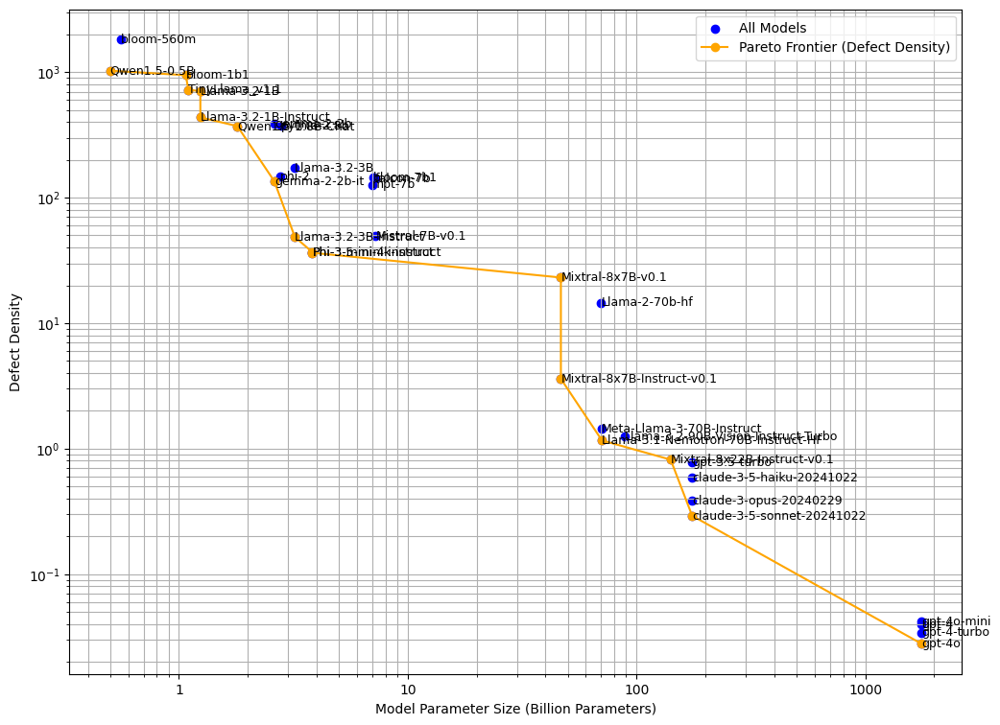

posx and posy should be finite values


Pareto Frontier (Accuracy):
                            model_name  Parameter Size (Billion Parameters)  \
1                         Qwen1.5-0.5B                                 0.50   
11                       gemma-2-2b-it                                 2.61   
21               Llama-3.2-3B-Instruct                                 3.21   
25              Phi-3-mini-4k-instruct                                 3.82   
26               Phi-3.5-mini-instruct                                 3.82   
33  Llama-3.1-Nemotron-70B-Instruct-HF                                70.60   
8           claude-3-5-sonnet-20241022                               175.00   
15                              gpt-4o                              1760.00   

    accuracy  
1   0.550699  
11  0.691434  
21  0.863636  
25  0.876748  
26  0.878497  
33  0.928322  
8   0.955420  
15  0.957168  


posx and posy should be finite values


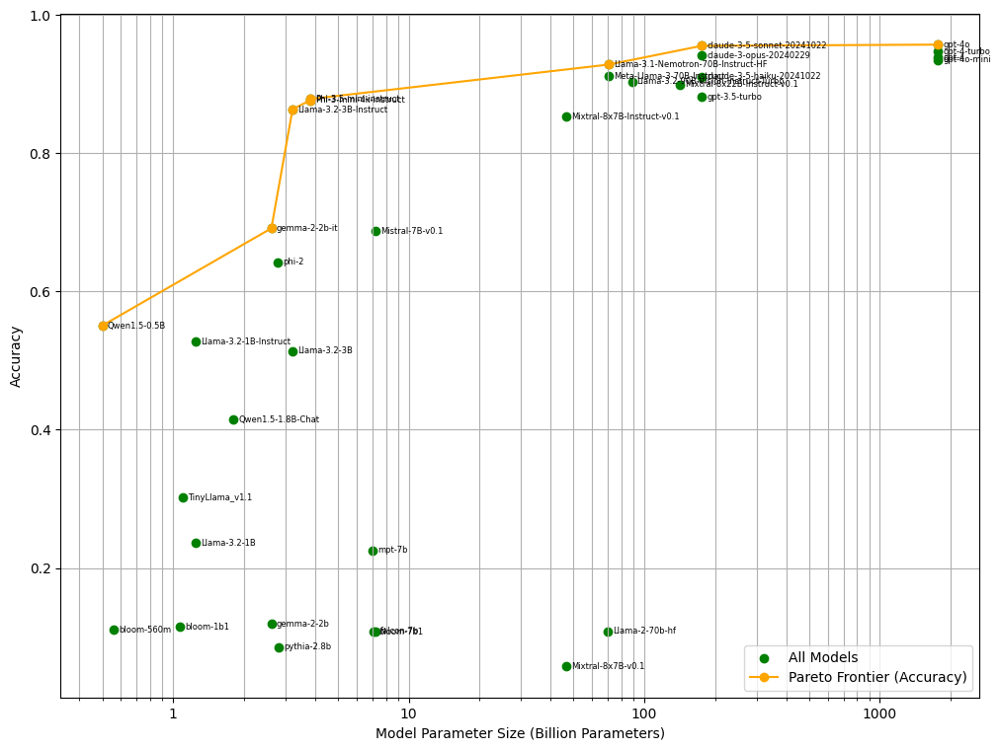

Pareto Frontier (Defect Density vs Release Date):
     model_name FM Release Date  defect_density
5    bloom-560m      2022-05-19     1821.109123
6     bloom-7b1      2022-05-19      144.413013
13        gpt-4      2023-03-01        0.039773
14  gpt-4-turbo      2023-11-06        0.034091
15       gpt-4o      2024-05-13        0.027841


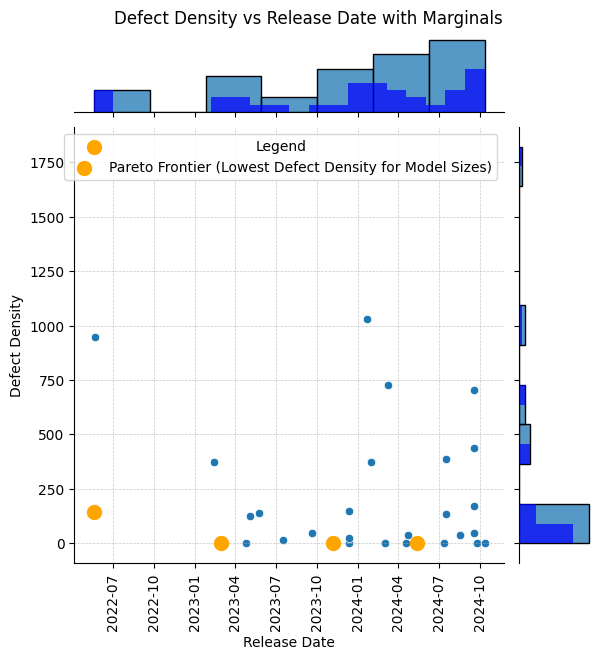

Pareto Frontier (Accuracy vs Release Date):
                    model_name FM Release Date  accuracy
5                   bloom-560m      2022-05-19  0.110140
4                    bloom-1b1      2022-05-22  0.114510
13                       gpt-4      2023-03-01  0.938811
14                 gpt-4-turbo      2023-11-06  0.947552
8   claude-3-5-sonnet-20241022      2024-03-01  0.955420
15                      gpt-4o      2024-05-13  0.957168


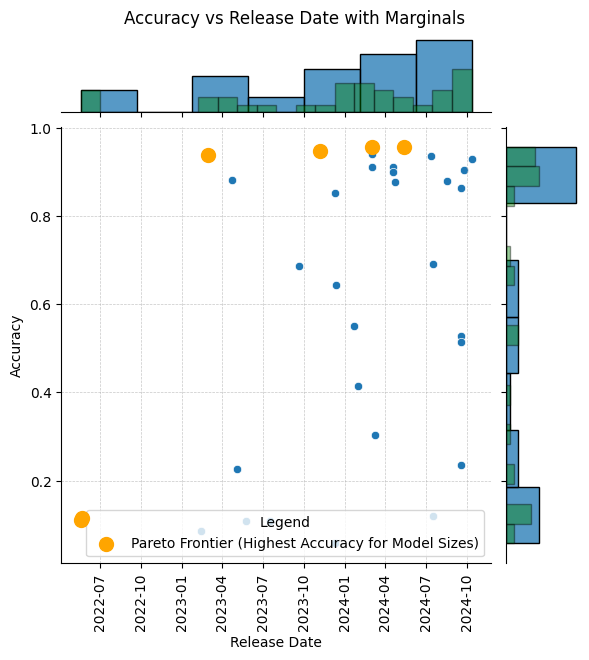

Pareto Frontier (Accuracy vs Release Date):
                    model_name FM Release Date  accuracy
5                   bloom-560m      2022-05-19  0.110140
4                    bloom-1b1      2022-05-22  0.114510
13                       gpt-4      2023-03-01  0.938811
14                 gpt-4-turbo      2023-11-06  0.947552
8   claude-3-5-sonnet-20241022      2024-03-01  0.955420
15                      gpt-4o      2024-05-13  0.957168


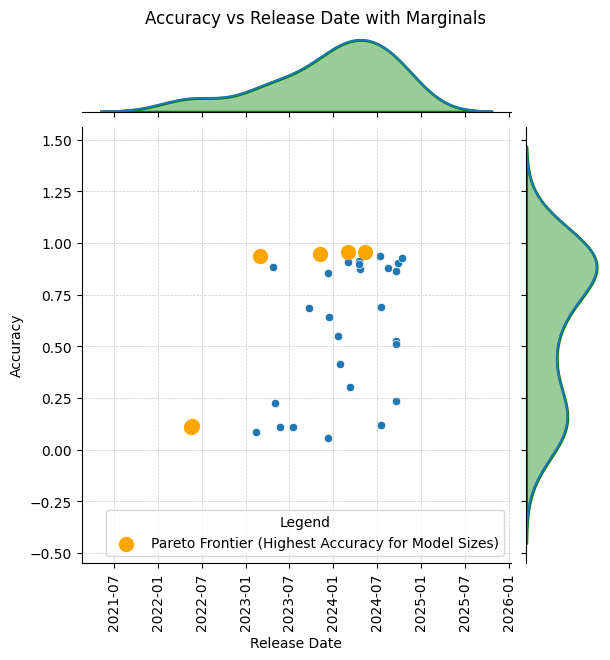

In [40]:
import seaborn as sns
################ OVERALL EXECUTION WORKFLOW ###################
df_all_samples_mcqs = extract_samples_data(df_all_results_files_info_filtered)
df_metrics_only_overall = calculate_metrics(df_all_samples_mcqs)

# Merge the DataFrames on the 'model alias' column?
df_metrics_only_overall['model_name'] = df_metrics_only_overall['model'].str.split('__').str[-1]
#### below line isnt working. troubleshoot if i want...it's becuase i add some stuff above that is unaccounted for.

df_metrics_only_overall_with_sizes = pd.merge(df_metrics_only_overall, df_models, left_on='model_name', right_on='Foundation Model (FM) Name', how='left')
df_metrics_only_overall_with_sizes_and_defects = calculate_defect_density(df_metrics_only_overall_with_sizes )
# plot_pareto_frontier(df_metrics_only_overall_with_sizes_and_defects)
# Now working to create 

# splitting pareto plotting into 2 different plots for ease of sharing with journal
plot_defect_density_vs_parameter_size_pareto(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True)
plot_accuracy_vs_parameter_size_pareto(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True)

# Pareto Frontier for Defect Density vs Release Date
plot_defect_density_vs_date_with_marginals(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True)
# Pareto Frontier for Accuracy vs Release Date
# plot_accuracy_vs_date_with_marginals(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True)


# With traditional histograms
plot_accuracy_vs_date_with_marginals(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True, use_kde=False)

# With KDE curves
plot_accuracy_vs_date_with_marginals(df_metrics_only_overall_with_sizes_and_defects, print_pareto_points=True, use_kde=True)


# Maybe adding sunburst plot instead of doing a giant table.
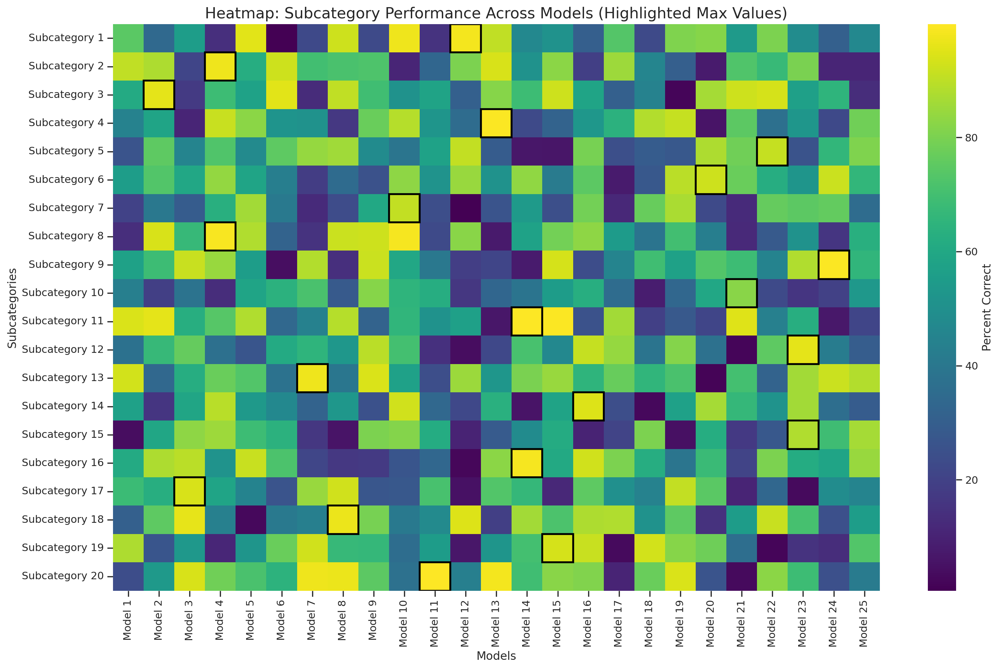

In [ ]:
# Add a bold black outline around the highest score in each row
plt.figure(figsize=(16, 10))
ax = sns.heatmap(data.drop(columns=['Category']), annot=False, cmap="viridis", cbar_kws={"label": "Percent Correct"})

# Loop through each row and highlight the maximum value
for i, row in enumerate(data.drop(columns=['Category']).values):
    max_col = np.argmax(row)
    ax.add_patch(plt.Rectangle((max_col, i), 1, 1, fill=False, edgecolor='black', lw=2))

plt.title("Heatmap: Subcategory Performance Across Models (Highlighted Max Values)", fontsize=16)
plt.xlabel("Models")
plt.ylabel("Subcategories")
plt.tight_layout()
plt.show()

# Create a sunburst plot to visualize hierarchical data
import plotly.express as px

# Prepare data for the sunburst
sunburst_data = pd.DataFrame({
    "Category": [data['Category'][i // len(models)] for i in range(len(data.index) * len(models))],
    "Subcategory": np.repeat(data.index, len(models)),
    "Model": np.tile(models, len(data.index)),
    "Accuracy": data.drop(columns=['Category']).values.flatten()
})

# Plot the sunburst
fig = px.sunburst(
    sunburst_data,
    path=["Category", "Subcategory", "Model"],
    values="Accuracy",
    color="Accuracy",
    color_continuous_scale="Viridis",
    title="Sunburst Chart: Accuracy Across Categories, Subcategories, and Models",
)

fig.show()


# Parsing and Exploding the INCOSE Handbook Categories 

In [58]:
print(df_all_samples_mcqs)


              task  task_size                      model model_dtype  \
0      sysengbench       1144  claude-3-5-haiku-20241022        None   
1      sysengbench       1144  claude-3-5-haiku-20241022        None   
2      sysengbench       1144  claude-3-5-haiku-20241022        None   
3      sysengbench       1144  claude-3-5-haiku-20241022        None   
4      sysengbench       1144  claude-3-5-haiku-20241022        None   
...            ...        ...                        ...         ...   
40035  sysengbench       1144                     gpt-4o        None   
40036  sysengbench       1144                     gpt-4o        None   
40037  sysengbench       1144                     gpt-4o        None   
40038  sysengbench       1144                     gpt-4o        None   
40039  sysengbench       1144                     gpt-4o        None   

       temperature                                           question  \
0              NaN  What best describes the concept of uncerta

In [59]:
##### first we need to explode the INCOSE Handbook Category column to get the individual categories
df_all_samples_mcqs_test = df_all_samples_mcqs
# need to take the last string behind the / and before the newline character
print(df_all_samples_mcqs_test)

print("========== BREAK =============")

def explode_incose_handbook_category(df):
    # Fill NaN values with empty strings to prevent issues during splitting
    df = df.copy()
    df.loc[:, 'INCOSE Handbook Category'] = df['INCOSE Handbook Category'].fillna('')
    
    # Explode 'INCOSE Handbook Category' by splitting on newline characters
    incose_expanded = df['INCOSE Handbook Category'].str.split('\n').explode()

    # Create a new DataFrame with expanded rows dynamically copying all columns
    incose_expanded_df = df.loc[incose_expanded.index].copy()
    incose_expanded_df['INCOSE Handbook Category'] = incose_expanded.values

    # Split 'INCOSE Handbook Category' into 'INCOSE Category' and 'INCOSE Sub-Category'
    incose_expanded_df[['INCOSE Category', 'INCOSE Sub-Category']] = incose_expanded_df['INCOSE Handbook Category'] \
        .str.extract(r'INCOSEHandbook/([^/]+)/(.+)')

    return incose_expanded_df.reset_index(drop=True)


expanded_df = explode_incose_handbook_category(df_all_samples_mcqs_test)
print(expanded_df)


              task  task_size                      model model_dtype  \
0      sysengbench       1144  claude-3-5-haiku-20241022        None   
1      sysengbench       1144  claude-3-5-haiku-20241022        None   
2      sysengbench       1144  claude-3-5-haiku-20241022        None   
3      sysengbench       1144  claude-3-5-haiku-20241022        None   
4      sysengbench       1144  claude-3-5-haiku-20241022        None   
...            ...        ...                        ...         ...   
40035  sysengbench       1144                     gpt-4o        None   
40036  sysengbench       1144                     gpt-4o        None   
40037  sysengbench       1144                     gpt-4o        None   
40038  sysengbench       1144                     gpt-4o        None   
40039  sysengbench       1144                     gpt-4o        None   

       temperature                                           question  \
0              NaN  What best describes the concept of uncerta

# Metrics by Category and Subcategory

In [60]:
def calculate_metrics(df):
    # Grouping by model, INCOSE Category, and INCOSE Sub-Category
    grouped = df.groupby(['model', 'INCOSE Category', 'INCOSE Sub-Category'])

    # Calculating metrics for each group
    metrics = grouped.agg(
        total_questions=('question', 'count'),
        correct_predictions=('true_answer', lambda x: (x == df.loc[x.index, 'predicted_answer']).sum()),
        accuracy=('true_answer', lambda x: (x == df.loc[x.index, 'predicted_answer']).mean())
    ).reset_index()

    return metrics
metrics_df = calculate_metrics(expanded_df)
print(metrics_df)


                       model                            INCOSE Category  \
0    EleutherAI__pythia-2.8b  Cross-Cutting Systems Engineering Methods   
1    EleutherAI__pythia-2.8b  Cross-Cutting Systems Engineering Methods   
2    EleutherAI__pythia-2.8b  Cross-Cutting Systems Engineering Methods   
3    EleutherAI__pythia-2.8b                           Lifecycle Stages   
4    EleutherAI__pythia-2.8b                           Lifecycle Stages   
..                       ...                                        ...   
695        tiiuae__falcon-7b             Technical Management Processes   
696        tiiuae__falcon-7b             Technical Management Processes   
697        tiiuae__falcon-7b             Technical Management Processes   
698        tiiuae__falcon-7b                        Technical Processes   
699        tiiuae__falcon-7b                        Technical Processes   

                                   INCOSE Sub-Category  total_questions  \
0    Model-Based Systems

In [61]:
metrics_df

,model,INCOSE Category,INCOSE Sub-Category,total_questions,correct_predictions,accuracy
0,EleutherAI__pythia-2.8b,Cross-Cutting Systems Engineering Methods,Model-Based Systems Engineering/Modeling Frame...,92,8,0.086957
1,EleutherAI__pythia-2.8b,Cross-Cutting Systems Engineering Methods,Model-Based Systems Engineering/Modeling Langu...,183,13,0.071038
2,EleutherAI__pythia-2.8b,Cross-Cutting Systems Engineering Methods,Modeling and Simulation,3,1,0.333333
3,EleutherAI__pythia-2.8b,Lifecycle Stages,Defense Acquisition Life Cycle/Lifecycle Phases,95,4,0.042105
4,EleutherAI__pythia-2.8b,Lifecycle Stages,Defense Acquisition Life Cycle/Milestones and ...,57,4,0.070175
...,...,...,...,...,...,...
695,tiiuae__falcon-7b,Technical Management Processes,Configuration and Information Management,43,7,0.162791
696,tiiuae__falcon-7b,Technical Management Processes,"Decision Management, Analysis of Alternatives,...",39,6,0.153846
697,tiiuae__falcon-7b,Technical Management Processes,Risk and Opportunity Management Process,30,8,0.266667
698,tiiuae__falcon-7b,Technical Processes,Architecture Definition Process,18,1,0.055556


# Exporting to Excel

In [62]:
import pandas as pd
from openpyxl import Workbook, load_workbook
from openpyxl.styles import PatternFill, Font, Alignment


def create_metrics_overview_sheet(metrics_df, wb):
    """
    Create the Metrics Overview sheet with color-coded formatting.

    Parameters:
    metrics_df (pd.DataFrame): DataFrame containing the metrics data.
    wb (Workbook): The Excel workbook to add the sheet to.
    """
    # Add a worksheet for metrics overview
    ws = wb.create_sheet(title="Metrics Overview")

    # Extract overall accuracy by model
    overall_accuracy = metrics_df.groupby('model')['accuracy'].mean().reset_index()
    overall_accuracy_dict = overall_accuracy.set_index('model')['accuracy'].to_dict()
    print("Overall accuracy by model:")
    print(overall_accuracy)

    # Get all unique categories and subcategories
    all_categories = metrics_df['INCOSE Category'].unique().tolist()
    print("All categories:")
    print(all_categories)

    # Create the header rows
    ws.append(["LLM", "LLM Overall Accuracy"] + all_categories)
    print("Header row created.")

    # Create the sub-header rows
    sub_headers = ["LLM", "LLM Overall Accuracy"]
    for category in all_categories:
        sub_categories = metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique().tolist()
        print(f"Subcategories for category '{category}': {sub_categories}")  # Debug output
        sub_headers.extend(sub_categories)
    ws.append(sub_headers)
    print("Sub-header row created:")
    print(sub_headers)

    # Fill in the data rows
    for model in metrics_df['model'].unique():
        row = [model, f"{overall_accuracy_dict[model]:.2f}"]
        for category in all_categories:
            sub_categories = metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique().tolist()
            for sub_category in sub_categories:
                accuracy = metrics_df[(metrics_df['model'] == model) &
                                      (metrics_df['INCOSE Category'] == category) &
                                      (metrics_df['INCOSE Sub-Category'] == sub_category)]['accuracy']
                if not accuracy.empty:
                    row.append(f"{accuracy.iloc[0]:.2f}")
                else:
                    row.append("N/A")
        ws.append(row)
        print(f"Data row for model {model} added:")
        print(row)

    # Format the header rows
    for cell in ws[1]:
        cell.font = Font(bold=True)
        cell.alignment = Alignment(horizontal="center")
    for cell in ws[2]:
        cell.font = Font(bold=True)
        cell.alignment = Alignment(horizontal="center")

    # Adjusting the top header row to avoid overwriting categories during merging
    col_idx = 3
    for category in all_categories:
        sub_categories_count = len(metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique())
        print(f"Merging cells for category '{category}' from column {col_idx} to {col_idx + sub_categories_count - 1}")
        if sub_categories_count > 0:  # Only merge if there are subcategories
            ws.merge_cells(start_row=1, start_column=col_idx, end_row=1, end_column=col_idx + sub_categories_count - 1)
            # Set the value for the merged cells
            ws.cell(row=1, column=col_idx).value = category
        col_idx += sub_categories_count

    # Merge cells for the LLM and LLM Overall Accuracy columns
    ws.merge_cells(start_row=1, start_column=1, end_row=2, end_column=1)
    ws.merge_cells(start_row=1, start_column=2, end_row=2, end_column=2)
    print("Merged cells for LLM and LLM Overall Accuracy columns.")


def create_metrics_overview_detailed_sheet(metrics_df, wb):
    """
    Create the Metrics Overview sheet with an additional row for category-level accuracies,
    calculating accuracies based on weighted averages considering total questions.
    Merge the 'LLM' and 'LLM Overall Accuracy' cells for each model across the two data rows.
    Make the text for all subcategory columns vertical and adjust the row height to accommodate the rotated text.
    Display all accuracy results to two decimal places.
    
    Parameters:
    metrics_df (pd.DataFrame): DataFrame containing the metrics data.
    wb (Workbook): The Excel workbook to add the sheet to.
    """
    from openpyxl.styles import Font, Alignment
    from openpyxl.utils import get_column_letter

    # Add a worksheet for metrics overview
    ws = wb.create_sheet(title="Metrics Overview Detailed")

    # Compute overall accuracy per model based on total correct predictions and total questions
    model_totals = metrics_df.groupby('model').agg({'correct_predictions': 'sum', 'total_questions': 'sum'}).reset_index()
    model_totals['accuracy'] = model_totals['correct_predictions'] / model_totals['total_questions']
    overall_accuracy_dict = model_totals.set_index('model')['accuracy'].to_dict()

    # Get all unique categories and subcategories
    all_categories = metrics_df['INCOSE Category'].unique().tolist()

    # Create the header and sub-header rows
    ws.append(["LLM", "LLM Overall Accuracy"] + all_categories)
    sub_headers = ["LLM", "LLM Overall Accuracy"]
    for category in all_categories:
        sub_categories = metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique().tolist()
        sub_headers.extend(sub_categories)
    ws.append(sub_headers)

    # Format the header rows
    # Row 1: Categories
    for cell in ws[1]:
        cell.font = Font(bold=True)
        cell.alignment = Alignment(horizontal="center", vertical="center")
    # Row 2: Subcategories
    for idx, cell in enumerate(ws[2], start=1):
        cell.font = Font(bold=True)
        if idx > 2:  # Skip the first two columns ('LLM' and 'LLM Overall Accuracy')
            cell.alignment = Alignment(horizontal="center", vertical="bottom", text_rotation=90)
        else:
            cell.alignment = Alignment(horizontal="center", vertical="center")

    # Adjusting the top header row to avoid overwriting categories during merging
    col_idx = 3
    for category in all_categories:
        sub_categories = metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique().tolist()
        sub_categories_count = len(sub_categories)
        if sub_categories_count > 0:  # Only merge if there are subcategories
            ws.merge_cells(start_row=1, start_column=col_idx, end_row=1, end_column=col_idx + sub_categories_count - 1)
            ws.cell(row=1, column=col_idx).value = category
            # Center align the merged header cell
            ws.cell(row=1, column=col_idx).alignment = Alignment(horizontal="center", vertical="center")
        col_idx += sub_categories_count

    # Merge cells for the LLM and LLM Overall Accuracy columns in the header
    ws.merge_cells(start_row=1, start_column=1, end_row=2, end_column=1)
    ws.merge_cells(start_row=1, start_column=2, end_row=2, end_column=2)
    # Center align the merged LLM cells
    ws.cell(row=1, column=1).alignment = Alignment(horizontal="center", vertical="center")
    ws.cell(row=1, column=2).alignment = Alignment(horizontal="center", vertical="center")

    # Fill in the data rows
    for model in metrics_df['model'].unique():
        # Record the starting row for this model
        start_row = ws.max_row + 1  # Since ws.max_row gives the last row with data, we add 1

        # Row 1: Subcategory-level accuracies
        row_subcategory = [model, f"{overall_accuracy_dict[model]:.2f}"]
        for category in all_categories:
            sub_categories = metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique().tolist()
            for sub_category in sub_categories:
                subcategory_data = metrics_df[(metrics_df['model'] == model) &
                                              (metrics_df['INCOSE Category'] == category) &
                                              (metrics_df['INCOSE Sub-Category'] == sub_category)]
                if not subcategory_data.empty:
                    total_correct = subcategory_data['correct_predictions'].sum()
                    total_questions = subcategory_data['total_questions'].sum()
                    accuracy = total_correct / total_questions if total_questions > 0 else float('nan')
                    row_subcategory.append(f"{accuracy:.2f}")
                else:
                    row_subcategory.append("N/A")
        ws.append(row_subcategory)

        # Row 2: Category-level accuracies (with merged cells)
        row_category = [model, f"{overall_accuracy_dict[model]:.2f}"]
        merge_info = []  # To store the merging information
        col_idx = 3  # Starting from the third column
        for category in all_categories:
            sub_categories = metrics_df[metrics_df['INCOSE Category'] == category]['INCOSE Sub-Category'].unique().tolist()
            sub_categories_count = len(sub_categories)
            category_data = metrics_df[(metrics_df['model'] == model) & (metrics_df['INCOSE Category'] == category)]
            total_correct = category_data['correct_predictions'].sum()
            total_questions = category_data['total_questions'].sum()
            if total_questions > 0:
                category_accuracy = total_correct / total_questions
                row_category.append(f"{category_accuracy:.2f}")
            else:
                row_category.append("N/A")
            # Fill the remaining cells with empty strings
            row_category.extend([""] * (sub_categories_count - 1))
            # Store the columns to merge
            if sub_categories_count > 0:
                merge_info.append((col_idx, col_idx + sub_categories_count - 1))
            col_idx += sub_categories_count
        ws.append(row_category)

        # Merge the category accuracy cells
        current_row = ws.max_row  # This is the row number of row_category
        for start_col, end_col in merge_info:
            ws.merge_cells(start_row=current_row, start_column=start_col, end_row=current_row, end_column=end_col)
            # Center align the merged cells
            cell = ws.cell(row=current_row, column=start_col)
            cell.alignment = Alignment(horizontal="center", vertical="center")

        # Merge the 'LLM' and 'LLM Overall Accuracy' cells across the two data rows
        for col in [1, 2]:  # Columns for 'LLM' and 'LLM Overall Accuracy'
            ws.merge_cells(start_row=start_row, start_column=col, end_row=current_row, end_column=col)
            # Center align the merged cells
            cell = ws.cell(row=start_row, column=col)
            cell.alignment = Alignment(horizontal="center", vertical="center")
            cell.font = Font(bold=True)

        # Apply center alignment to data cells under subcategory columns
        for row in ws.iter_rows(min_row=start_row, max_row=current_row, min_col=3):
            for cell in row:
                cell.alignment = Alignment(horizontal="center", vertical="center")

    # Adjust column widths based on maximum content length in each column
    for idx, col in enumerate(ws.columns, start=1):
        col_cells = list(col)
        column_index = col_cells[0].column  # Get the column index
        column_letter = get_column_letter(column_index)
        max_length = 0
        for cell in col_cells:
            try:
                if cell.value:
                    # For rotated text, length does not affect column width
                    if cell.row == 2 and idx > 2:
                        continue  # Skip adjusting width based on rotated text
                    else:
                        max_length = max(max_length, len(str(cell.value)))
            except:
                pass
        adjusted_width = max_length + 2
        ws.column_dimensions[column_letter].width = adjusted_width

    # Set row height for subcategory header row to accommodate rotated text
    ws.row_dimensions[2].height = 100  # Adjust this value as needed

def create_metrics_df_sheet(metrics_df, wb):
    """
    Export the metrics DataFrame to an Excel workbook as a separate sheet.

    Parameters:
    metrics_df (pd.DataFrame): The metrics DataFrame to export.
    wb (Workbook): The Excel workbook to add the sheet to.
    """
    # Add a worksheet for metrics_df
    ws = wb.create_sheet(title="Metrics DataFrame")

    # Write the headers to the worksheet
    ws.append(metrics_df.columns.tolist())
    print("Headers written to Metrics DataFrame worksheet.")

    # Write the data to the worksheet
    for row in metrics_df.itertuples(index=False, name=None):
        ws.append(row)
    print("Data written to Metrics DataFrame worksheet.")


def highlight_best_answers(wb, highlight=True, highlight_color="C6EFCE", bold=False):
    """
    Highlight the best answers in the "Metrics Overview" sheet by filling cells with the highest values in a given color or making them bold.

    Parameters:
    wb (Workbook): The Excel workbook containing the "Metrics Overview" sheet.
    highlight (bool): Whether to highlight the best cells.
    highlight_color (str): The color to use for highlighting.
    bold (bool): Whether to make the best cells bold.
    """
    # Select the Metrics Overview sheet
    ws = wb["Metrics Overview"]

    # Define the highlight fill and font styles
    fill = PatternFill(start_color=highlight_color, end_color=highlight_color, fill_type="solid")
    bold_font = Font(bold=True)

    # Highlight or bold the best answers
    print("Finding the best values in each column and applying formatting...")
    for col in ws.iter_cols(min_row=3, min_col=3):
        best_value = None
        for cell in col:
            if isinstance(cell.value, str) and cell.value != "N/A":
                try:
                    value = float(cell.value)
                    if best_value is None or value > best_value:
                        best_value = value
                except ValueError:
                    continue
        for cell in col:
            if isinstance(cell.value, str) and cell.value != "N/A":
                try:
                    value = float(cell.value)
                    if value == best_value:
                        if highlight:
                            print(f"Highlighting cell {cell.coordinate} with color {highlight_color}")
                            cell.fill = fill
                        if bold:
                            print(f"Making cell {cell.coordinate} bold")
                            cell.font = bold_font
                except ValueError:
                    continue

def highlight_best_category_accuracies(wb, highlight=True, highlight_color="C6EFCE", bold=False):
    """
    Highlight the best category-level accuracies in the "Metrics Overview Detailed" sheet by filling cells with the highest values in a given color or making them bold.

    Parameters:
    wb (Workbook): The Excel workbook containing the "Metrics Overview Detailed" sheet.
    highlight (bool): Whether to highlight the best cells.
    highlight_color (str): The color to use for highlighting.
    bold (bool): Whether to make the best cells bold.
    """
    from openpyxl.styles import Font, PatternFill

    # Select the "Metrics Overview Detailed" sheet
    ws = wb["Metrics Overview Detailed"]

    # Define the highlight fill and font styles
    fill = PatternFill(start_color=highlight_color, end_color=highlight_color, fill_type="solid")
    bold_font = Font(bold=True)

    # Find the starting row of the data (after the headers)
    # Assuming headers are in rows 1 and 2
    data_start_row = 3

    # Identify the columns for categories
    # Categories are in the first header row (row 1), starting from column 3
    category_columns = []
    col_idx = 3
    while True:
        cell = ws.cell(row=1, column=col_idx)
        if cell.value is None:
            break  # End of categories
        # Get the number of subcategories under this category
        merged_cells = ws.merged_cells.ranges
        merged_range = None
        for merged_cell in merged_cells:
            if cell.coordinate in merged_cell:
                merged_range = merged_cell
                break
        if merged_range:
            start_col = merged_range.min_col
            end_col = merged_range.max_col
        else:
            start_col = col_idx
            end_col = col_idx
        category_columns.append((cell.value, start_col, end_col))
        col_idx = end_col + 1

    # Iterate over each category to find and highlight the best accuracy
    for category_name, start_col, end_col in category_columns:
        best_value = None
        best_cells = []
        # Iterate over the category-level accuracy rows
        # Assuming that for each model, category accuracies are in the second row of their data block
        row_idx = data_start_row
        while row_idx <= ws.max_row:
            # Get the cell for this category's accuracy (merged cell)
            cell = ws.cell(row=row_idx + 1, column=start_col)  # row_idx + 1 because category accuracies are in the second row
            value = cell.value
            if isinstance(value, str) and value != "N/A":
                try:
                    accuracy = float(value)
                    if best_value is None or accuracy > best_value:
                        best_value = accuracy
                        best_cells = [cell]
                    elif accuracy == best_value:
                        best_cells.append(cell)
                except ValueError:
                    pass
            row_idx += 2  # Move to the next model's data block (each model has two data rows)

        # Highlight the best cells
        for cell in best_cells:
            # Apply formatting to the merged cell
            if highlight:
                cell.fill = fill
            if bold:
                cell.font = bold_font

    # Optionally, highlight the best overall accuracies in the 'LLM Overall Accuracy' column (column 2)
    best_overall_value = None
    best_overall_cells = []
    row_idx = data_start_row
    while row_idx <= ws.max_row:
        cell = ws.cell(row=row_idx, column=2)  # Overall accuracy is in column 2
        value = cell.value
        if isinstance(value, str) and value != "N/A":
            try:
                accuracy = float(value)
                if best_overall_value is None or accuracy > best_overall_value:
                    best_overall_value = accuracy
                    best_overall_cells = [cell]
                elif accuracy == best_overall_value:
                    best_overall_cells.append(cell)
            except ValueError:
                pass
        row_idx += 2  # Move to the next model's data block

    # Highlight the best overall accuracy cells
    for cell in best_overall_cells:
        if highlight:
            cell.fill = fill
        if bold:
            cell.font = bold_font



# Usage example
wb = Workbook()
wb.remove(wb.active)  # Remove the default sheet
create_metrics_overview_sheet(metrics_df, wb)
create_metrics_overview_detailed_sheet(metrics_df, wb)

create_metrics_df_sheet(metrics_df, wb)

# Highlight best subcategory answers in the "Metrics Overview" sheet
highlight_best_answers(wb, highlight=True, highlight_color="C6EFCE", bold=True)
# Highlight best category answers in the "Metrics Overview Detailed" sheet
highlight_best_category_accuracies(wb, highlight=True, highlight_color="C6EFCE", bold=True)


# Save workbook
try:
    print("Saving workbook...")
    wb.save("publication_metrics.xlsx")
    print("Workbook saved as 'publication_metrics.xlsx'.")
except PermissionError:
    temp_filename = "temp_publication_metrics.xlsx"
    print("Attempting to save as a temporary file due to permission issues...")
    wb.save(temp_filename)
    print(f"Workbook saved as temporary file: '{temp_filename}' due to permission issues.")


Overall accuracy by model:
                                              model  accuracy
0                           EleutherAI__pythia-2.8b  0.097943
1                                Qwen__Qwen1.5-0.5B  0.584667
2                           Qwen__Qwen1.5-1.8B-Chat  0.464377
3                         TinyLlama__TinyLlama_v1.1  0.322776
4                             bigscience__bloom-1b1  0.106724
5                            bigscience__bloom-560m  0.106169
6                             bigscience__bloom-7b1  0.104652
7                         claude-3-5-haiku-20241022  0.925137
8                        claude-3-5-sonnet-20241022  0.959482
9                            claude-3-opus-20240229  0.949874
10                               google__gemma-2-2b  0.113610
11                            google__gemma-2-2b-it  0.732441
12                                    gpt-3.5-turbo  0.900596
13                                            gpt-4  0.950998
14                                      gpt

# Add Export to LaTeX here.

## Tables

In [57]:
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt

# Assuming metrics_df is already defined and contains the calculated metrics

# Step 1: Split 'incose_category' into different levels using the '/' character
category_levels = metrics_df['incose_category'].str.split('/', expand=True)
metrics_df['Level 1'] = category_levels[0]
metrics_df['Level 2'] = category_levels[1]
metrics_df['Level 3'] = category_levels[2]

# Step 2: Create a summary for each level with TOTALs for aggregation

# Summary for Level 3 (granular level)
level_3_summary = metrics_df.groupby(['task', 'model', 'Level 1', 'Level 2', 'Level 3']).agg({
    'accuracy': 'mean',
    'stderr': 'mean',
    'precision': 'mean',
    'recall': 'mean',
    'f1_score': 'mean'
}).reset_index()

# Summary for Level 2 with TOTALs for Level 3
level_2_summary = metrics_df.groupby(['task', 'model', 'Level 1', 'Level 2']).agg({
    'accuracy': 'mean',
    'stderr': 'mean',
    'precision': 'mean',
    'recall': 'mean',
    'f1_score': 'mean'
}).reset_index()
level_2_summary['Level 3'] = 'TOTAL'

# Summary for Level 1 with TOTALs for Level 2
level_1_summary = metrics_df.groupby(['task', 'model', 'Level 1']).agg({
    'accuracy': 'mean',
    'stderr': 'mean',
    'precision': 'mean',
    'recall': 'mean',
    'f1_score': 'mean'
}).reset_index()
level_1_summary['Level 2'] = 'TOTAL'
level_1_summary['Level 3'] = 'TOTAL'

# Combine all summaries into one single DataFrame with TOTALs at each level
combined_summary = pd.concat([level_3_summary, level_2_summary, level_1_summary], ignore_index=True)

# Sort the combined summary for better readability
combined_summary.sort_values(by=['task', 'model', 'Level 1', 'Level 2', 'Level 3'], inplace=True)

# Step 3: Generate a publication-worthy table for the combined summary
combined_table_str = tabulate(combined_summary, headers='keys', tablefmt='github', floatfmt='.2f')
print("Combined Summary with TOTALs for All Levels:")
print(combined_table_str)



Combined Summary with TOTALs for All Levels:
|    | task        | model                     | Level 1        | Level 2                          | Level 3                                        |   accuracy |   stderr |   precision |   recall |   f1_score |
|----|-------------|---------------------------|----------------|----------------------------------|------------------------------------------------|------------|----------|-------------|----------|------------|
|  0 | sysengbench | EleutherAI__pythia-2.8b   | INCOSEHandbook | Lifecycle Stages                 | Generic Life Cycle Stages                      |       0.50 |     0.35 |        0.50 |     0.25 |       0.33 |
| 12 | sysengbench | EleutherAI__pythia-2.8b   | INCOSEHandbook | Lifecycle Stages                 | TOTAL                                          |       0.50 |     0.35 |        0.50 |     0.25 |       0.33 |
|  1 | sysengbench | EleutherAI__pythia-2.8b   | INCOSEHandbook | Specialty Engineering Activities | Reliab

## Bar Charts

### By Model Release Date

In [70]:
print(metrics_df)

           task  task_size                      model    model_dtype  \
0   sysengbench         10    EleutherAI__pythia-2.8b  torch.float16   
1   sysengbench         10    EleutherAI__pythia-2.8b  torch.float16   
2   sysengbench         10    EleutherAI__pythia-2.8b  torch.float16   
3   sysengbench         10    EleutherAI__pythia-2.8b  torch.float16   
8   sysengbench         10           microsoft__phi-2  torch.float16   
9   sysengbench         10           microsoft__phi-2  torch.float16   
10  sysengbench         10           microsoft__phi-2  torch.float16   
11  sysengbench         10           microsoft__phi-2  torch.float16   
4   sysengbench         10  TinyLlama__TinyLlama_v1.1  torch.float32   
5   sysengbench         10  TinyLlama__TinyLlama_v1.1  torch.float32   
6   sysengbench         10  TinyLlama__TinyLlama_v1.1  torch.float32   
7   sysengbench         10  TinyLlama__TinyLlama_v1.1  torch.float32   

    temperature                                    incose_categ

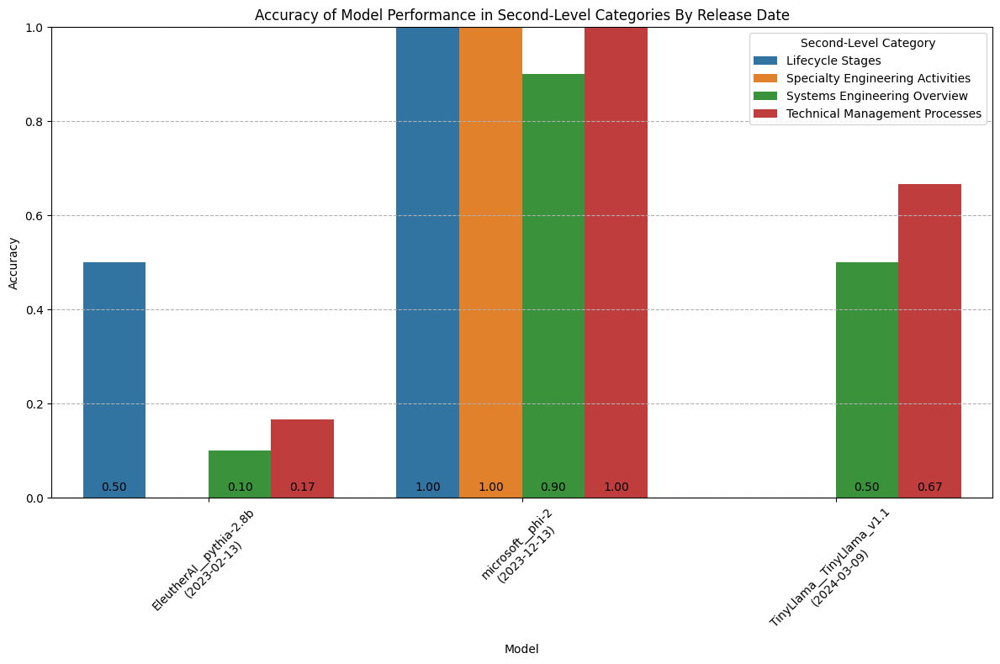

In [71]:
# Step 1: Split 'incose_category' into different levels using the '/' character
category_levels = metrics_df['incose_category'].str.split('/', expand=True)
metrics_df['Level 1'] = category_levels[0]
metrics_df['Level 2'] = category_levels[1]
metrics_df['Level 3'] = category_levels[2]

import seaborn as sns
# Sort the merged DataFrame by release date
metrics_df.sort_values(by='Release Date', inplace=True)

# Plotting overall accuracy by second-level category with bar graphs
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x=metrics_df.apply(lambda row: f"{row['model']}\n({row['Release Date'].strftime('%Y-%m-%d')})", axis=1), y='accuracy', hue='Level 2', data=metrics_df)

# add the accuracy at the base of the bars
for p in barplot.patches:
    if p.get_height() > 0:
        barplot.annotate(format(p.get_height(), '.2f'), 
                        (p.get_x() + p.get_width() / 2., 0), 
                        ha='center', va='center', 
                        xytext=(0, 9), 
                        textcoords='offset points')
        
        
plt.title('Accuracy of Model Performance in Second-Level Categories By Release Date')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
# add dashed grid lines
plt.grid(axis='y', linestyle='--')
plt.ylim(0, 1)
plt.legend(title='Second-Level Category')
plt.tight_layout()
plt.show()


######## BELOW NEEDS UPDATING

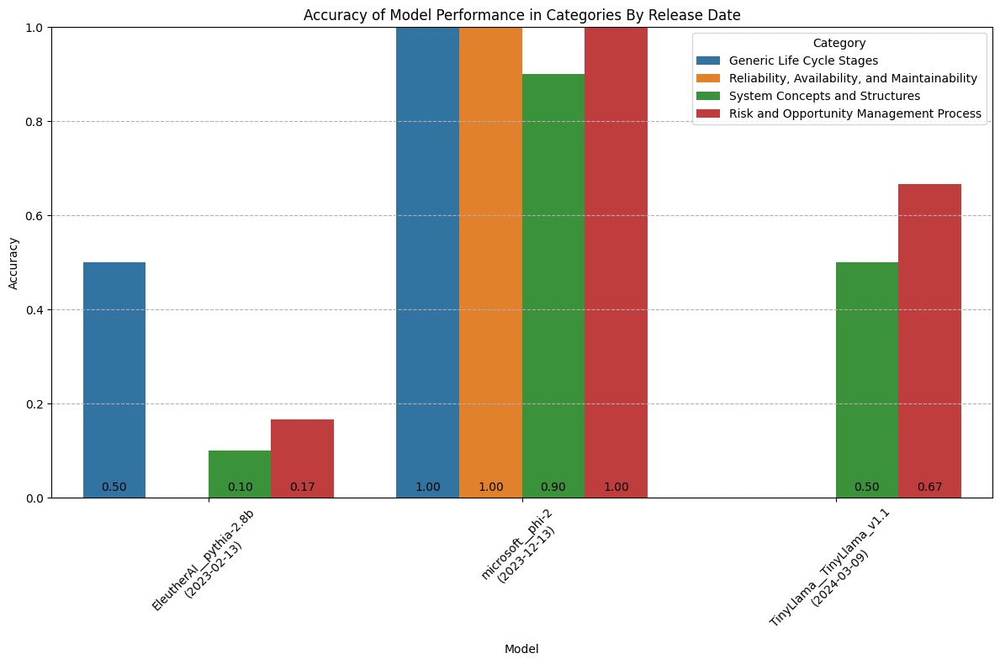

In [73]:
import seaborn as sns
# Sort the merged DataFrame by release date
metrics_df.sort_values(by='Release Date', inplace=True)

# Plotting overall accuracy by category with bar graphs
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x=metrics_df.apply(lambda row: f"{row['model']}\n({row['Release Date'].strftime('%Y-%m-%d')})", axis=1), y='accuracy', hue='Level 3', data=metrics_df)

# add the accuracy at the base of the bars
for p in barplot.patches:
    if p.get_height() > 0:
        barplot.annotate(format(p.get_height(), '.2f'), 
                        (p.get_x() + p.get_width() / 2., 0), 
                        ha='center', va='center', 
                        xytext=(0, 9), 
                        textcoords='offset points')
        
        
plt.title('Accuracy of Model Performance in Categories By Release Date')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
# add dashed grid lines
plt.grid(axis='y', linestyle='--')
plt.ylim(0, 1)
plt.legend(title='Category')
plt.tight_layout()
plt.show()

### By Model Size

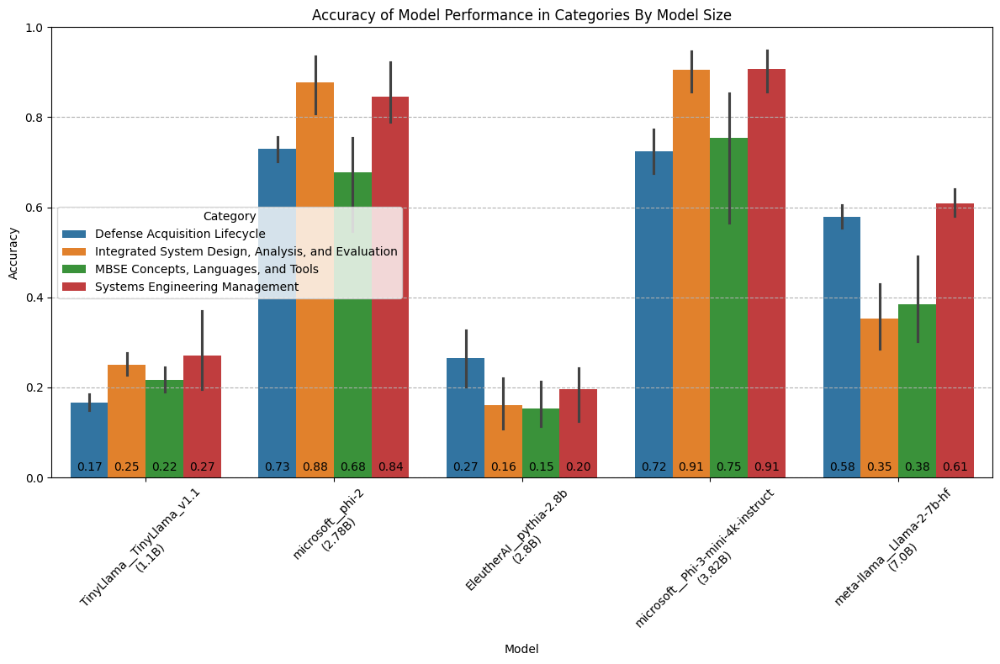

In [112]:
# Sort the merged DataFrame by release date
metrics_df.sort_values(by='Size (Billion Parameters)', inplace=True)

# Plotting overall accuracy by category with bar graphs
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x=metrics_df.apply(lambda row: f"{row['model']}\n({row['Size (Billion Parameters)']}B)", axis=1), y='accuracy', hue='category', data=metrics_df)

# add the accuracy at the base of the bars
for p in barplot.patches:
    if p.get_height() > 0:
        barplot.annotate(format(p.get_height(), '.2f'), 
                        (p.get_x() + p.get_width() / 2., 0), 
                        ha='center', va='center', 
                        xytext=(0, 9), 
                        textcoords='offset points')
        
plt.title('Accuracy of Model Performance in Categories By Model Size')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
# add dashed grid lines
plt.grid(axis='y', linestyle='--')
plt.ylim(0, 1)
plt.legend(title='Category')
# plt.legend(title='Category', bbox_to_anchor=(0.5, 1.15), loc='center')
plt.tight_layout()
plt.show()


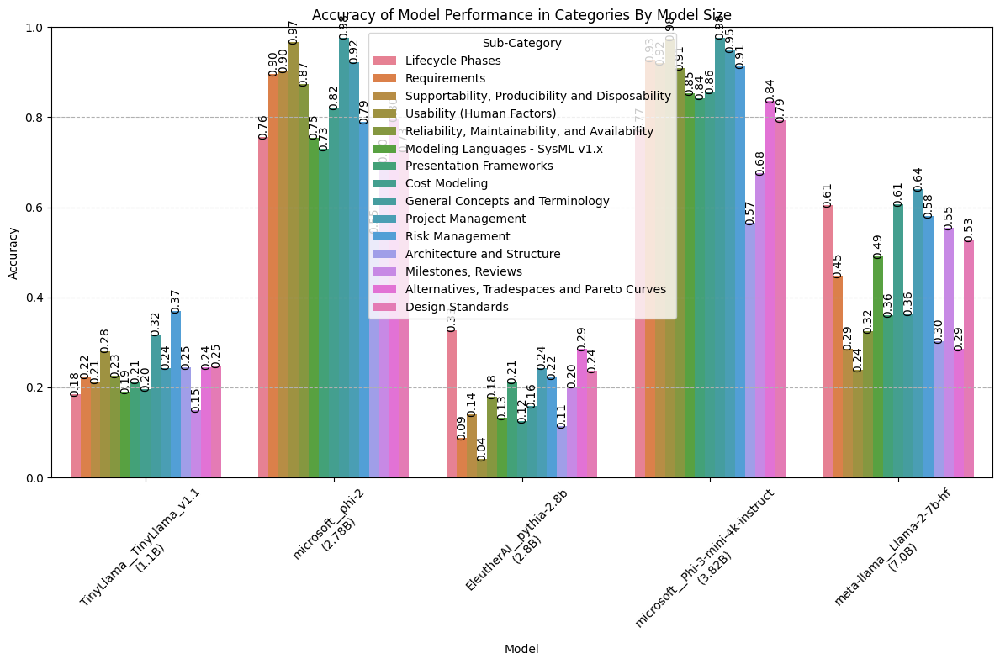

In [113]:
# Sort the merged DataFrame by release date
metrics_df.sort_values(by='Size (Billion Parameters)', inplace=True)

# Plotting overall accuracy by category with bar graphs
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x=metrics_df.apply(lambda row: f"{row['model']}\n({row['Size (Billion Parameters)']}B)", axis=1), y='accuracy', hue='sub_category', data=metrics_df)
# put text of the accuracy on the bars if height is non-zero
for p in barplot.patches:
    if p.get_height() > 0:
        barplot.annotate(format(p.get_height(), '.2f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha='center', va='center', 
                         xytext=(0, 9), 
                         textcoords='offset points',
                         rotation=90)
plt.title('Accuracy of Model Performance in Categories By Model Size')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
# add dashed grid lines
plt.grid(axis='y', linestyle='--')
plt.ylim(0, 1)
plt.legend(title='Sub-Category')
plt.tight_layout()
plt.show()